In [59]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 

%matplotlib inline 

In [60]:
#function show ảnh
def show_images(*images):
    # Tạo một khung đồ thị với 1 hàng và số lượng hình ảnh cột
    fig, axs = plt.subplots(1, len(images), figsize=(5 * len(images), 5))

    # Nếu chỉ có một hình ảnh, axs sẽ không phải là một mảng
    # Do đó, chúng ta cần chuyển nó thành một mảng để có thể lặp qua nó
    if len(images) == 1:
        axs = [axs]

    # Show images
    for i, img in enumerate(images):
        # If image have less than 3 channels, show it in gray 
        if img.ndim < 3:
            axs[i].imshow(img, cmap='gray')
        else:
            axs[i].imshow(img)
        axs[i].set_title(f'Image {i+1}')

    plt.show()


# Bai 1

In [61]:
# Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min
# max tương ứng với cừng kênh màu
def img_info(img):
    print(f'Height: {img.shape[0]} - Width: {img.shape[1]} - Channels: {len(img.shape)}')
    if len(img.shape) == 3:
        print("Ảnh màu")
        print(f'R Min: {img[:,:,0].min()} - Max {img[:,:,0].max()} ')
        print(f'G Min: {img[:,:,1].min()} - Max {img[:,:,1].max()} ')
        print(f'B Min: {img[:,:,2].min()} - Max {img[:,:,2].max()} ')
    elif len(img.shape) == 2:
        print('Ảnh xám')
        print(f'Min: {img.min()} - Max: {img.max()}')

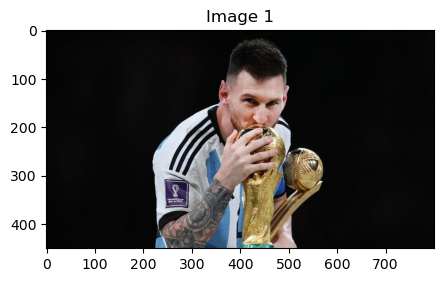

Height: 450 - Width: 800 - Channels: 3
Ảnh màu
R Min: 0 - Max 255 
G Min: 0 - Max 255 
B Min: 0 - Max 255 


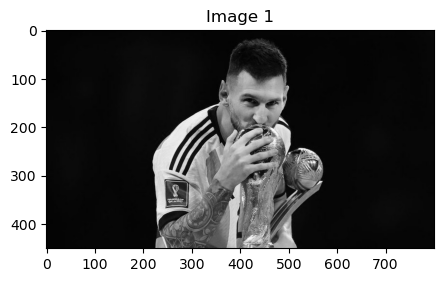

Height: 450 - Width: 800 - Channels: 2
Ảnh xám
Min: 0 - Max: 255


In [62]:
img1 = cv2.imread('C:/Users/trand/Documents/Digital Image Processing/Lab02/img/img1.jpg')
color_img_1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
show_images(color_img_1)
img_info(color_img_1)
gray_img_1 = cv2.cvtColor(color_img_1,cv2.COLOR_BGR2GRAY)
show_images(gray_img_1)
img_info(gray_img_1)

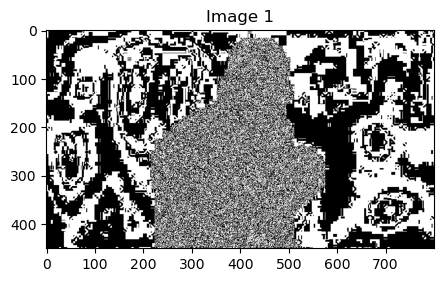

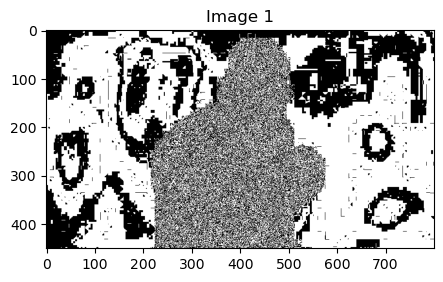

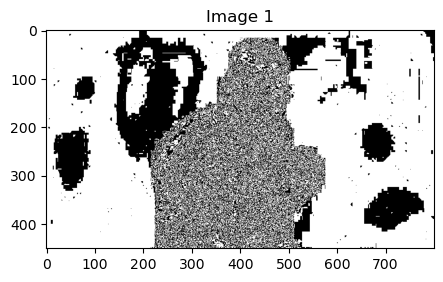

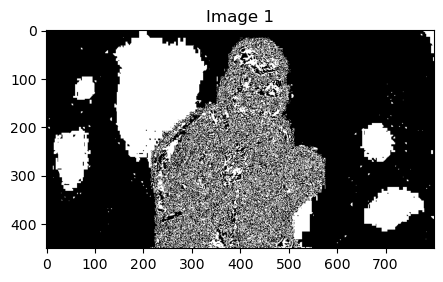

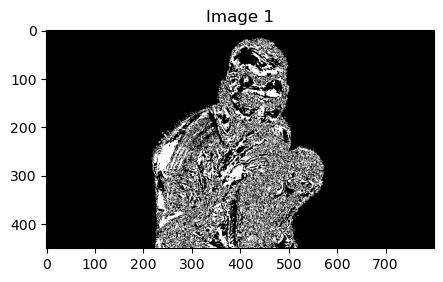

...

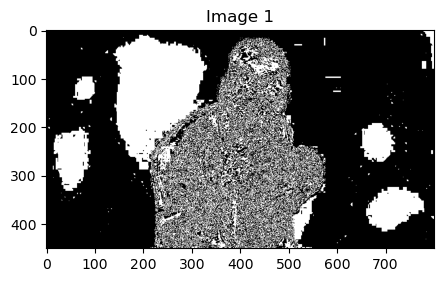

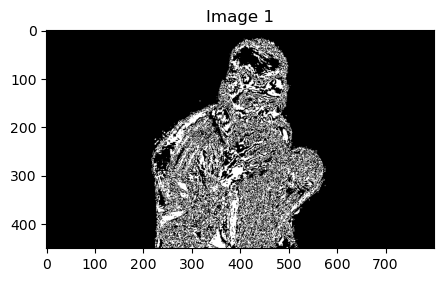

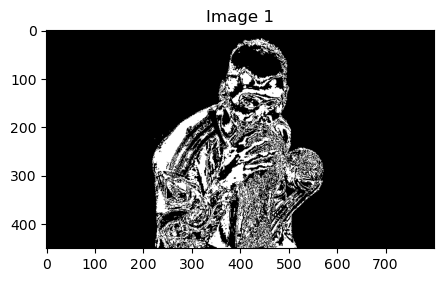

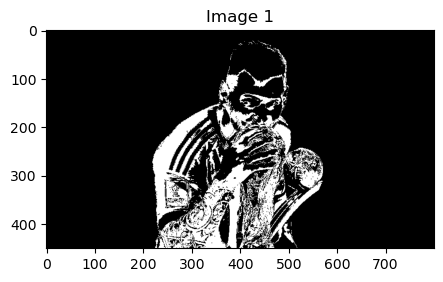

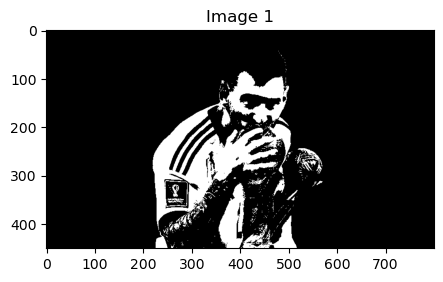

In [63]:
#Tách kênh màu RGB
rgb_channels = cv2.split(color_img_1)

# Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)
for channel in rgb_channels:
    for i in range(8):
        bit_image = (channel >> i) & 1
        #hiện thị ảnh bit
        show_images(bit_image*255)
    


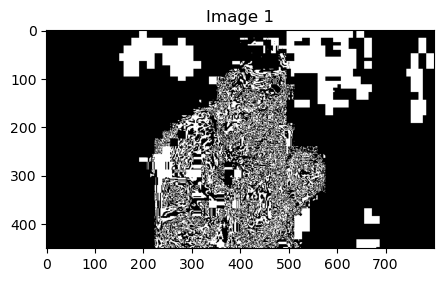

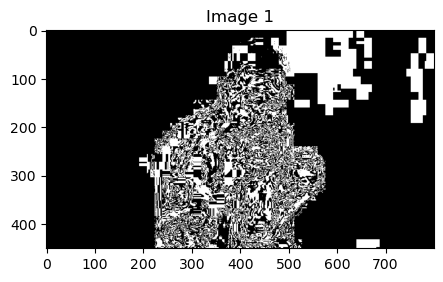

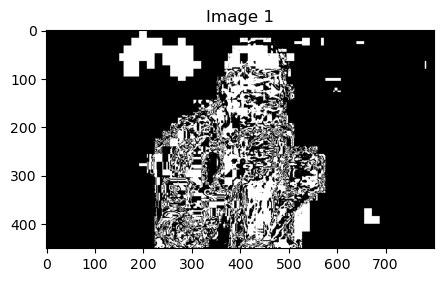

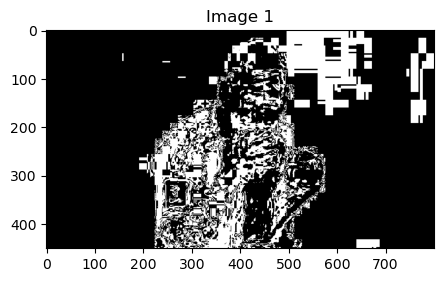

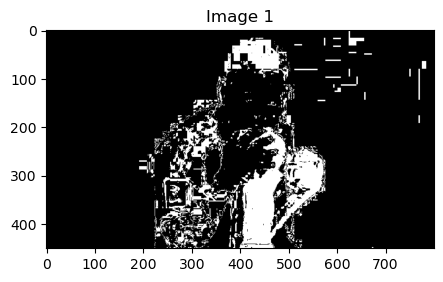

...

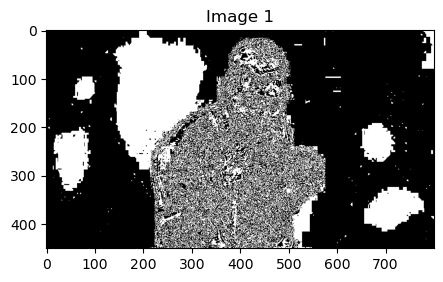

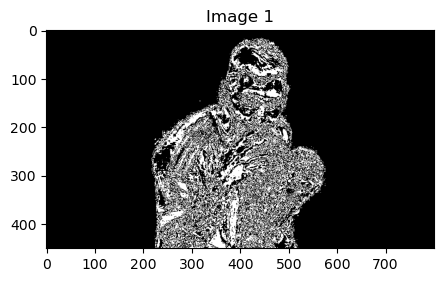

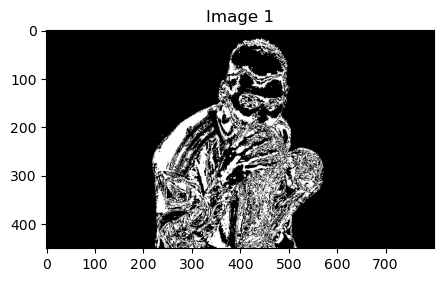

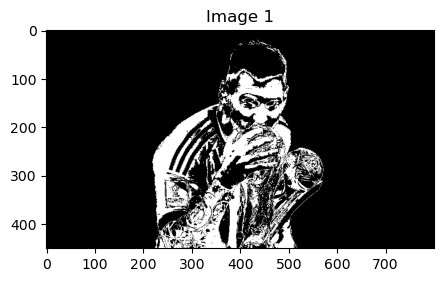

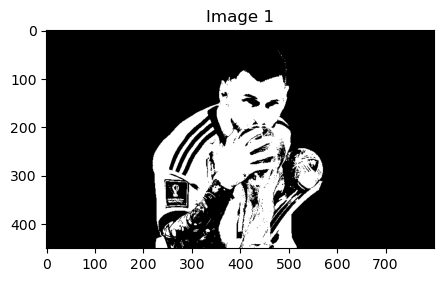

In [64]:
#tạo ảnh HSV
hsv_img_1 = cv2.cvtColor(img1,cv2.COLOR_BGR2HSV)
#Tách kênh màu HSV
hsv_channels = cv2.split(hsv_img_1)

#Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)
for channel in hsv_channels:
    for i in range(8):
        bit_image = (channel >> i) & 1
        show_images(bit_image*255)

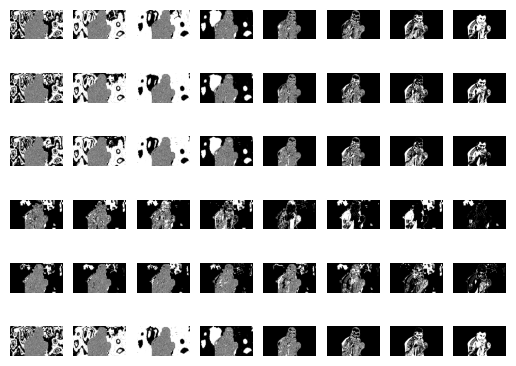

In [65]:
# Hiển thị 24 bức ảnh bit cho mỗi kênh màu RGB và HSV cho dễ nhìn 
for i, channel in enumerate(rgb_channels + hsv_channels):
    for bit in range(8):
        plt.subplot(6, 8, i*8 + bit + 1)
        plt.imshow(channel & (1 << bit), cmap='gray')
        plt.axis('off')

plt.show()

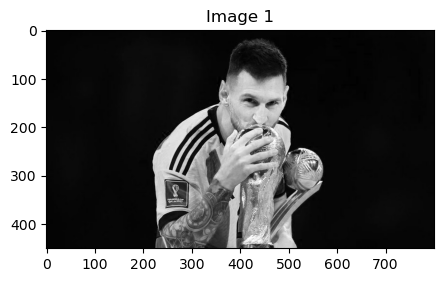

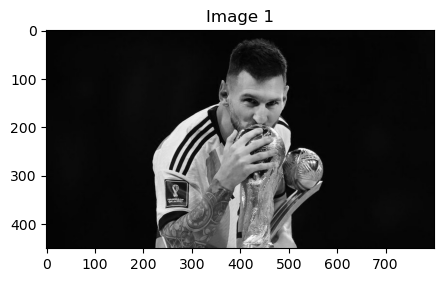

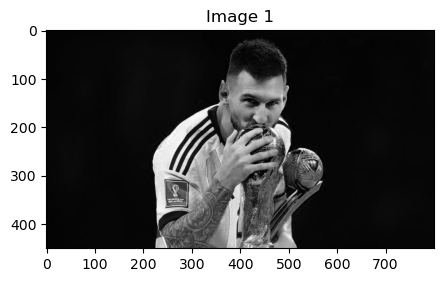

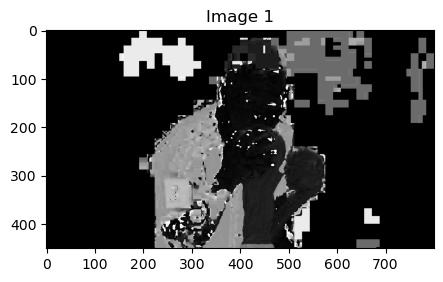

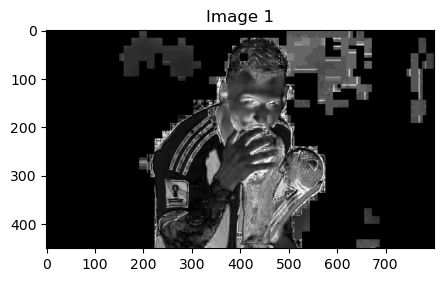

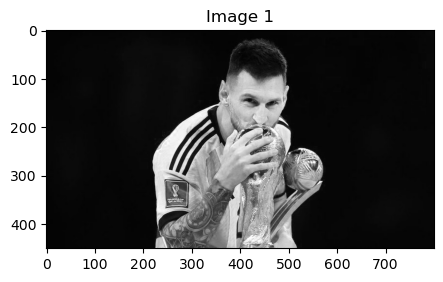

In [66]:
for i, channel in enumerate(rgb_channels + hsv_channels):
    # Xuất ảnh 8 bit của kênh màu (Hàm plt.show() luôn hiện thị ảnh 8bit)
    show_images(channel)

In [67]:
def process_image(img):
    # Chuyển đổi ảnh sang grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
     # Chuyển đổi ảnh sang không gian màu HSV
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    # Định nghĩa range màu để trích xuất khuôn mặt (ví dụ: range màu da)
    lower = np.array([0, 48, 80], dtype=np.uint8)  # Màu da thấp nhất trong không gian màu HSV
    upper = np.array([20, 255, 255], dtype=np.uint8)  # Màu da cao nhất trong không gian màu HSV

    # Tạo mask dựa trên range màu 
    mask = cv2.inRange(hsv_img, lower, upper)

    # Áp mask lên ảnh để trích xuất khuôn mặt
    extracted_faces = cv2.bitwise_and(img, img, mask=mask)

    # Hiển thị khuôn mặt đã trích xuất
    show_images(img,gray_img)
    show_images(extracted_faces,mask)


In [68]:
img_2 = cv2.imread('C:/Users/trand/Documents/Digital Image Processing/Lab02/img/img2.jpg')
color_img_2 = cv2.cvtColor(img_2,cv2.COLOR_BGR2RGB)

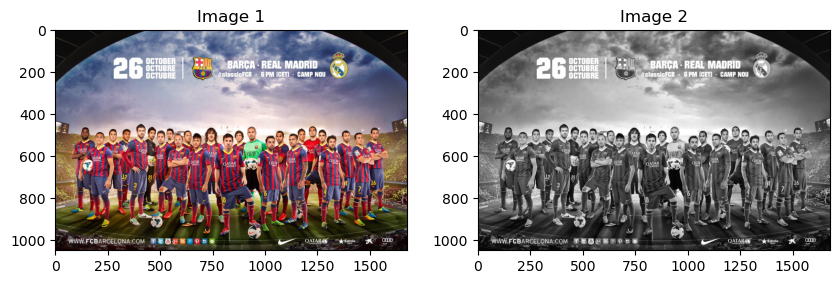

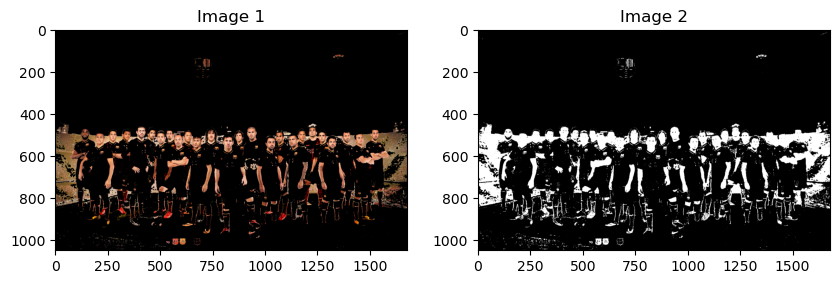

In [69]:
process_image(color_img_2)

kích thước ảnh cao:686 - rộng:457


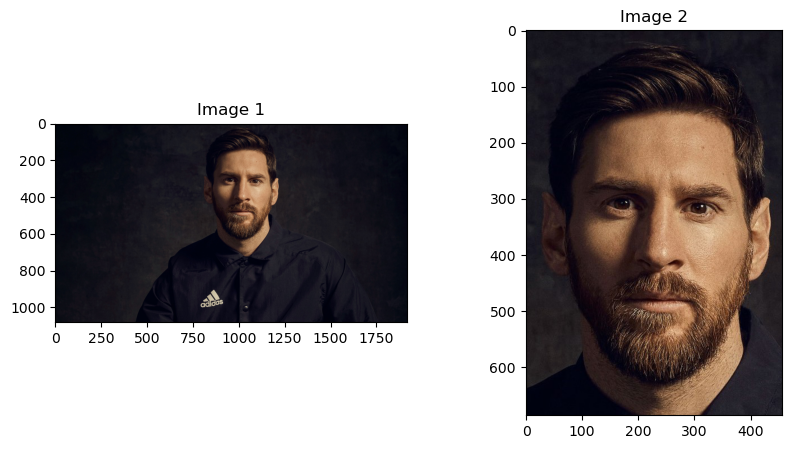

In [70]:
# Ảnh Full
full = cv2.imread('C:/Users/trand/Documents/Digital Image Processing/Lab02/img/img3.jpg')
full = cv2.cvtColor(full, cv2.COLOR_BGR2RGB)

# ảnh để so sánh
face= cv2.imread('C:/Users/trand/Documents/Digital Image Processing/Lab02/img/img5.jpg')
face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
#kích thước của ảnh face
height, width,channels = face.shape
print(f'kích thước ảnh cao:{height} - rộng:{width}')
#hiện thị ảnh
show_images(full,face)

In [71]:
def template_matching(full, face, method):
        # Create a copy of the image
    full_copy = full.copy()
    # Apply template Matching with the method
    res = cv2.matchTemplate(full_copy, face, method)

    # Grab the Max and Min values, plus their locations
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method == cv2.TM_SQDIFF | method == cv2.TM_SQDIFF_NORMED:
        top_left = min_loc    
    else:
        top_left = max_loc

    # Assign the Bottom Right of the rectangle
    bottom_right = (top_left[0] + width, top_left[1] + height)

    # Draw the Red Rectangle
    cv2.rectangle(full_copy, top_left, bottom_right, 255, 10)

    # Plot the Images
    plt.subplot(121)
    plt.imshow(res)
    plt.title('Result of Template Matching')

    plt.subplot(122)
    plt.imshow(full_copy)
    plt.title('Detected Point')
    

    plt.show()

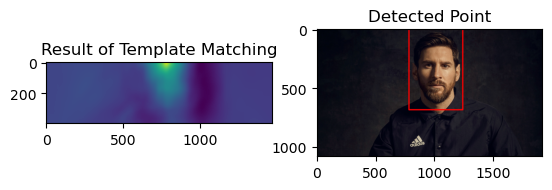

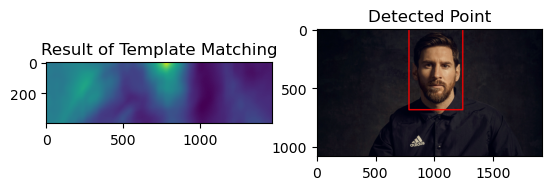

In [72]:
#methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']
template_matching(full, face, cv2.TM_CCOEFF )
template_matching(full, face, cv2.TM_CCOEFF_NORMED)


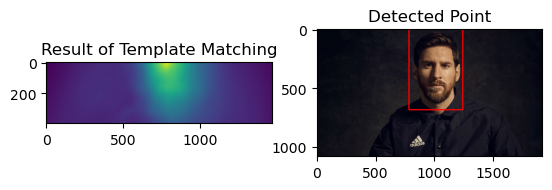

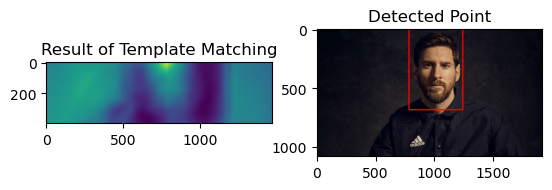

In [73]:
template_matching(full, face, cv2.TM_CCORR)
template_matching(full, face, cv2.TM_CCORR_NORMED)


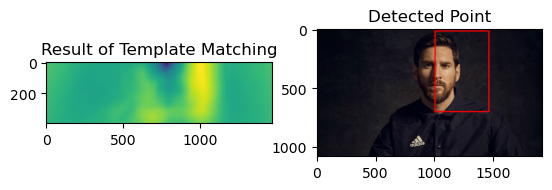

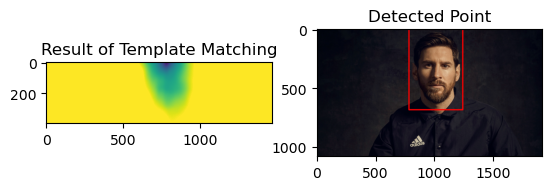

In [74]:
template_matching(full, face, cv2.TM_SQDIFF)
template_matching(full, face, cv2.TM_SQDIFF_NORMED)

In [75]:
#mô hình train sẵn
face_cascade = cv2.CascadeClassifier('C:/Users/trand/Documents/Digital Image Processing/Lab02/DATA/haarcascades/haarcascade_frontalface_default.xml')

In [76]:
def adj_detect_face(img):
    
    face_img = img.copy()
    
    #Gọi hàm tìm mặt từ mô hình
    face_rects = face_cascade.detectMultiScale(face_img,scaleFactor=1.2, minNeighbors=5) 
    
    #Vẽ khung chữ nhật màu trắng trên từng mặt phát hiện
    for (x,y,w,h) in face_rects: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img

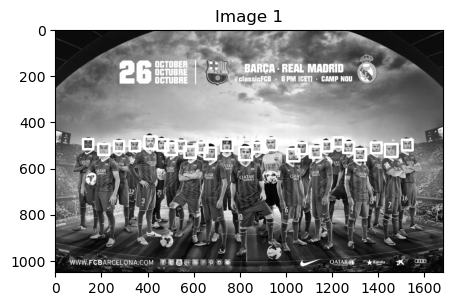

In [77]:
#
gray_img_2 = cv2.cvtColor(color_img_2,cv2.COLOR_RGB2GRAY)
result = adj_detect_face(gray_img_2)
show_images(result)

In [78]:
##Bai 3

In [79]:
img_3 = cv2.imread('C:/Users/trand/Documents/Digital Image Processing/Lab02/img/img6.jpg')
color_img_3 = cv2.cvtColor(img_3,cv2.COLOR_BGR2RGB)

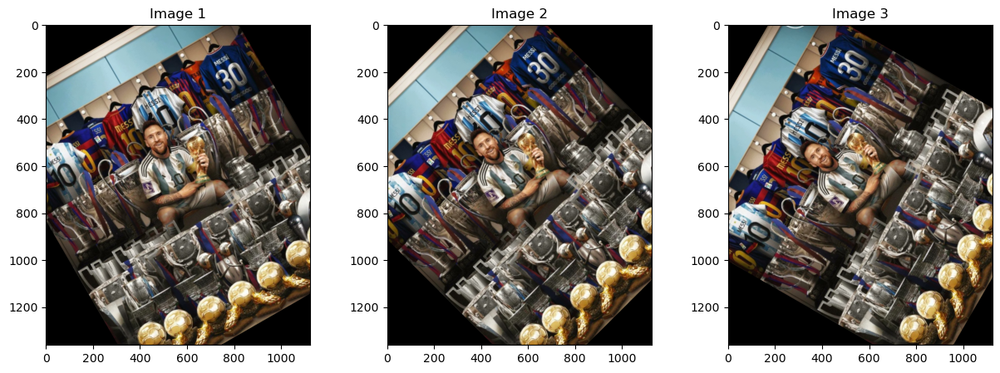

In [80]:
#Xuất ảnh xoay các góc 30,45,60 độ
from skimage.transform import rotate
# Xoay ảnh
img_30 =  rotate(color_img_3, 30)
img_45 =  rotate(color_img_3, 45)
img_60 =  rotate(color_img_3, 60)
#Hiện thị ảnh
show_images(img_30,img_45,img_60)

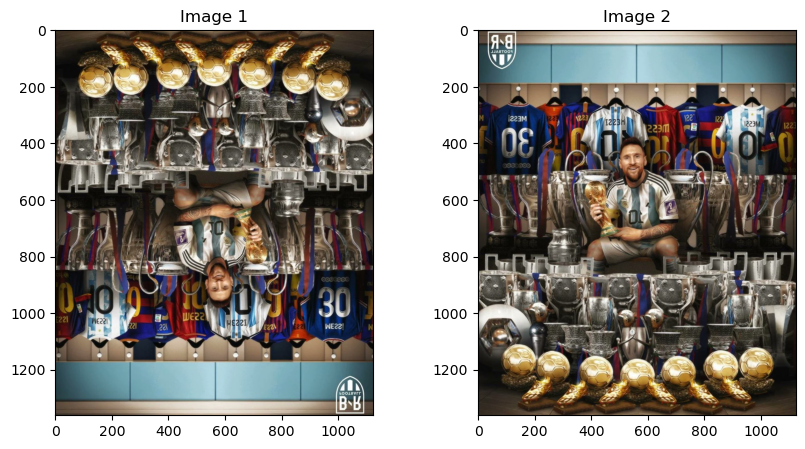

In [81]:
# Đối xứng qua trục hoành và trục tung
flip_horizontal = cv2.flip(color_img_3, 0)
flip_vertical = cv2.flip(color_img_3, 1)

show_images(flip_horizontal,flip_vertical)

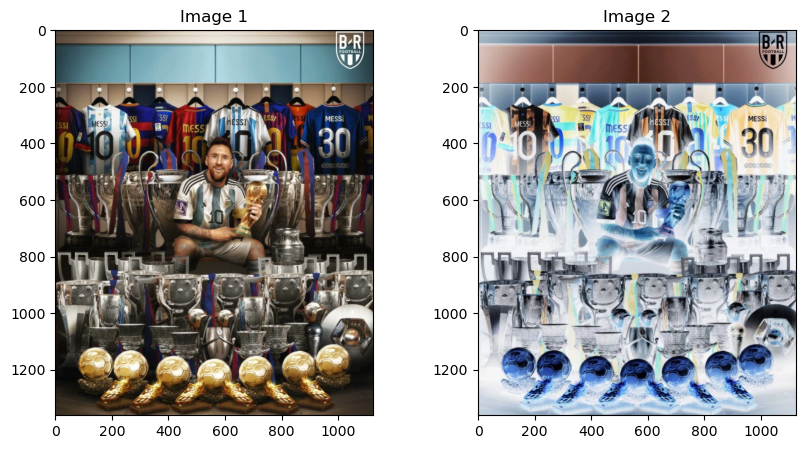

In [82]:
#Xuất ảnh inversion
inverted_img = cv2.bitwise_not(color_img_3)
show_images(color_img_3,inverted_img)

C:\Users\trand\anaconda3\lib\site-packages\skimage\_shared\utils.py:326: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


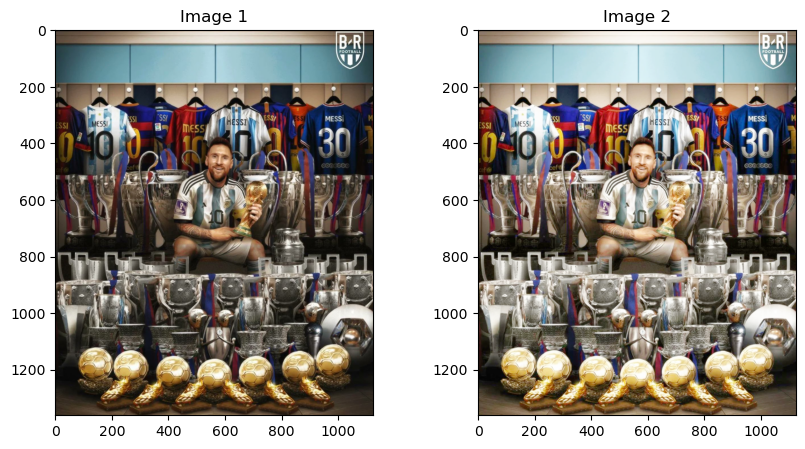

In [83]:
#Xuất ảnh enhance contrast
from skimage import exposure
enhanced_img = exposure.equalize_hist(color_img_3)
show_images(color_img_3,enhanced_img)

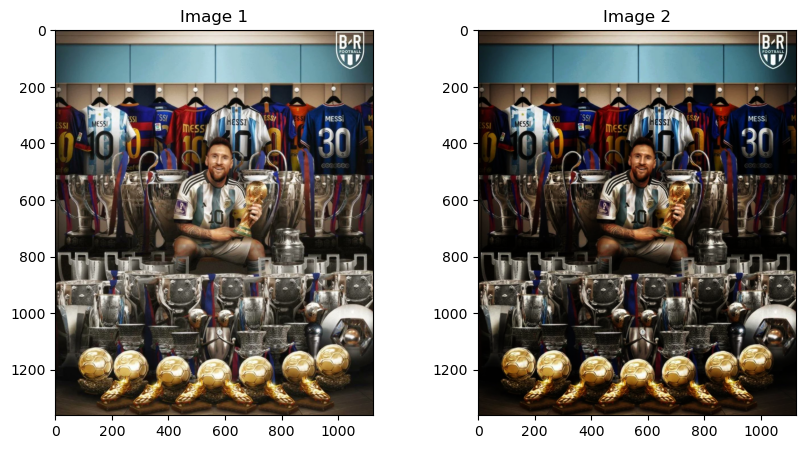

In [84]:
#gamma enhancement
gamma = 1.5
adjusted_gamma_image = np.power(color_img_3 / 255.0, gamma)
adjusted_gamma_image = (adjusted_gamma_image * 255).astype(np.uint8)
show_images(color_img_3,adjusted_gamma_image)

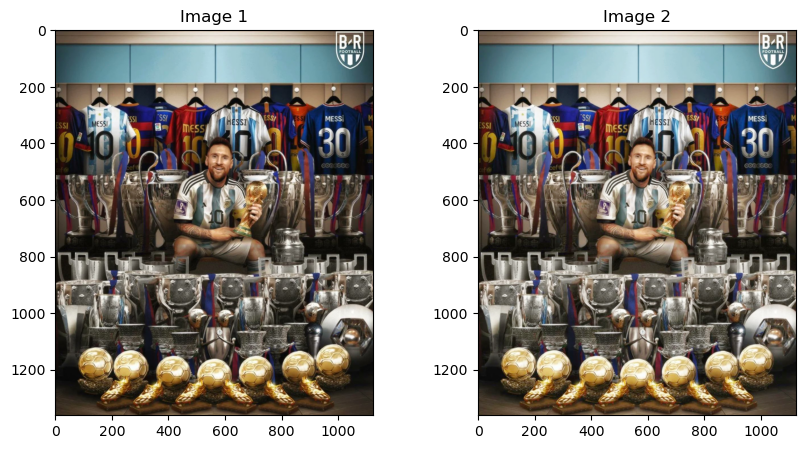

In [85]:
#log enhancement
adjusted_log_image = exposure.adjust_log(color_img_3)
show_images(color_img_3,adjusted_log_image)